Kotug Project, Group 1

Allan Guzman, June Chen, Sarah Blanc

(Please make sure to first read the file called "README.md". It helps to get the main story line of what we did and the organization of the files.)

Let's maybe first remember here the research questions of this project:

**Main Research Question**:

"How can the reliability and efficiency of Kotug OptiPort's tugboat scheduling tool be enhanced through the development and evaluation of novel methods for predicting pickup and drop-off coordinates and other relevant variables?"

**Subresearch Questions**:

- "What advanced predictive methods can be developed and implemented to accurately forecast the coordinates (latitude and longitude) for pickup and drop-off locations of tugs on vessels in the port of Rotterdam?"
- "Which variables, including AIS data, customer requirements, and port-specific constraints (or lack thereof), play a significant role in determining the pickup and drop-off locations and timing of tugs, as well as the required number of tugs for each vessel operation in the port of Rotterdam, and why are they important?"
- "Which of the above mentioned variables can be combined in order to increase the reliability of the results, and why can they be combined?"

The work on this first research question in done in the file called "Prediction", while the 2 other subquestions are answered in this file. 

## DATA PROCESSING

Data processing refers to the transformation of raw data into meaningful and actionable insights. It includes a set of procedures that transform data into a form that can be used for analysis, interpretation, and making decisions. This vital procedure is essential for a number of reasons, all of which support the overall effectiveness and success of this data science project.
1. Extracting insights from our raw data: in its purest form, our raw data lacks organisation and clarity. In order to make sure the data is reliable and consistent, it must be cleaned, and arranged. This conversion makes it easier to extract insightful information that may be applied to a our forecasting method.
2. Enhancing data quality: it helps in identifying and rectifying errors, inconsistencies, and inaccuracies within our data. We may make decisions based on trustworthy information and achieve better results and more operational efficiency.
3. Facilitating data integration: in this project, we work with data from several sources. data processing allows us to harmonise and integrate our data into a single format. 

In this file, you can aslo find visualizations of the Rotterdam DataSet, especially the port and the method with the squares (dsicretization) that we decide to use.

### Import the required librairies

In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import json
import matplotlib.pyplot as plt
from ipyleaflet import Map, GeoJSON, GeoData, basemaps, LayersControl
from shapely.geometry import Point, Polygon, LineString, MultiPoint
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import folium
import rasterio
import rasterio.mask
from rasterio.plot import reshape_as_image 
from rasterio.plot import reshape_as_raster
from shapely.ops import unary_union

import geopandas as gpd
from shapely.geometry import Point
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from shapelysmooth import catmull_rom_smooth
from shapelysmooth import chaikin_smooth

from scipy.spatial import KDTree
import numpy as np
from shapely.geometry import LineString

from shapely.ops import nearest_points
from pyproj import Geod
from scipy.interpolate import BSpline


This stage holds paramount importance for the progression of the project. Here, our main goal is to carefully clean and prepare the several dataframes that are needed in order to use the prediction techniques. It is necessary to recognise that the data that has been supplied is, in its natural state, inadequate and inappropriate for our needs at this time. A great deal of work has gone into fixing the numerous problems that the datasets include. Given the sheer enormity of some datasets (ais data sets), a specialized tool in the realm of data science was employed to streamline part of the data processing. This concerns the data about the vessels (dimensions: lenght and width, draught, and type). This tool, called Alteryx Designer, proved instrumental in handling the intricacies of large datasets efficiently. Indeed, Alteryx Designer is a powerful data analytics and visualization tool that allows users to prepare, blend, and analyze data quickly and efficiently. The decision to opt for this tool was driven by the extensive time required to load the data for each month when utilizing Python on our computers. Due to this extended period, we decided to utilise the knowledge of a team member who had previously worked with Alteryx Designer.

Furthermore, it is important to mention that after a discussion with the employees of Kotug, only the first pick-up and the last drop-off locations have to be predicted. This means that if many tugs help a vessel, only the locations of the first one that pick-up and the last one to drop-off will be predicted.

## Import the raw data and EDA

**Historic Towages Data**

In [2]:
# Opening JSON file
f = open('Data/Input_EDA/historic_towages.json')
#f = open('Data/Input_EDA/historic_towages.json')
 
# returns JSON object as a dictionary
tow_data = json.load(f)
 
# Closing file
f.close()

In [3]:
# Create empty lists to store tugs data and their original JSON index
tugs_data = []
trip_ID = []
vessel_name = []  # Create a list to store previous vessel names
vessel_mmsi = []  # Create a list to store previous vessel names


# Extract tugs data into a separate list, store their original index, and the previous vessel name
for i, item in enumerate(tow_data):
    for tug in item['tugs']:
        tugs_data.append(tug)
        trip_ID.append(i)
        vessel_name.append(item['vessel']['name'])
        vessel_mmsi.append(item['vessel']['mmsi'])


# Create a DataFrame for tugs data with the original index and previous vessel name
tugs_df = pd.DataFrame(tugs_data)
tugs_df['trip_ID'] = trip_ID  # Add original index as a new column
tugs_df['vessel_name'] = vessel_name  # Add vessel name as a new column
tugs_df['vessel_mmsi'] = vessel_mmsi

tugs_df['from'] = pd.to_datetime(tugs_df['from'],format='ISO8601')
tugs_df['to'] = pd.to_datetime(tugs_df['to'],format='ISO8601')

tugs_df['from_rounded'] = tugs_df['from'].dt.round('H')
tugs_df['to_rounded'] = tugs_df['to'].dt.round('H')

# Create a DataFrame for the rest of the data (excluding tugs)
vessel_info = [{'from': item['from'],
               'to': item['to'],
               'vessel': item['vessel'],
               'type': item['type'],
               'additional_data': item['additional_data']}
              for item in tow_data]

vessel_df = pd.DataFrame(vessel_info)

tugs_df = tugs_df.merge(vessel_df['type'], left_on='trip_ID', right_index=True)

### Weather data
Addition of the weather data (direction of the wind and wind speed)
We categorized them in excel, in order to be able to use them in the prediction model. We chose to have 8 categories for the wind speed (N, NE, E, SE, S, SW, W, NW) and 4 categories for the wind speed (Low, Mid, High, Extreme). We collected the data for the 31st of May 2022, till the 2nd of June 2023. This idea here was to take a little buffer margin on the time intervall, so we were sure to get at least all the data needed.

In [4]:
#weather data
wind = pd.read_csv('Data/Input_EDA/Weather.csv')
wind['Datetime'] =  pd.to_datetime(wind['Datetime'])
wind.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8808 entries, 0 to 8807
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   # STN                8808 non-null   int64              
 1   YYYYMMDD             8808 non-null   int64              
 2   H                    8808 non-null   int64              
 3   Datetime             8808 non-null   datetime64[ns, UTC]
 4      DD                8808 non-null   int64              
 5   Wind_Speed           8808 non-null   int64              
 6   Wind_Direction_Cat1  8808 non-null   object             
 7   Wind_Direction_Cat2  8808 non-null   object             
 8   Wind_speed_cat       8808 non-null   object             
dtypes: datetime64[ns, UTC](1), int64(5), object(3)
memory usage: 619.4+ KB


### Vessel data information

Here you can see the csv files that have been imported from the special tool, after processing the data there.

In [5]:
vessel_size_data = pd.read_csv('Data/Input_EDA/Vessel_size_data.csv')
vessel_draught_data = pd.read_csv('Data/Input_EDA/Vessel-draught_data.csv')

In [6]:
vessel_draught_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1307701 entries, 0 to 1307700
Data columns (total 3 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   device_mmsi         1307698 non-null  float64
 1   Navigation_draught  1307696 non-null  float64
 2   DateTime            1307695 non-null  object 
dtypes: float64(2), object(1)
memory usage: 29.9+ MB


In [7]:
vessel_draught_data.dropna(inplace= True)
vessel_draught_data['device_mmsi'] = vessel_draught_data['device_mmsi'].astype(int)
vessel_draught_data['DateTime'] = vessel_draught_data['DateTime'].str.replace('"', '')
vessel_draught_data['DateTime'] = pd.to_datetime(vessel_draught_data['DateTime'], format='ISO8601')

vessel_draught_data.head()

,device_mmsi,Navigation_draught,DateTime
0,246367000,3.3,2022-10-19 07:00:00+00:00
1,246367000,3.3,2022-10-19 08:00:00+00:00
2,246367000,3.3,2022-10-19 09:00:00+00:00
3,244660631,2.6,2022-10-09 17:00:00+00:00
4,244660631,2.6,2022-10-09 18:00:00+00:00


#### Incoming vessels

In [8]:
tugs_incoming = tugs_df[tugs_df['type']=='incoming']
tugs_incoming = tugs_incoming[['from','from_rounded', 'from_location' ,'to_haven', 'trip_ID', 'vessel_mmsi']]

# Create a Shapely Point geometry from the "from_location" coordinates
tugs_incoming['geometry'] = tugs_incoming['from_location'].apply(lambda coord: Point(coord))
tugs_incoming['from_location'] = tugs_incoming['from_location'].apply(lambda coord: Point(coord))

# Convert the DataFrame to a GeoDataFrame
tugs_incoming_gdf = gpd.GeoDataFrame(tugs_incoming, geometry='geometry')
tugs_incoming_gdf = tugs_incoming_gdf.set_crs("EPSG:4326")

#### Leaving vessels

In [9]:
# Filter fot leaving
tugs_leaving = tugs_df[tugs_df['type']=='leaving']
tugs_leaving = tugs_leaving[['to','to_rounded',	'to_location' ,'from_haven', 'trip_ID', 'vessel_mmsi']]

# Create a Shapely Point geometry from the "from_location" coordinates
tugs_leaving['geometry'] = tugs_leaving['to_location'].apply(lambda coord: Point(coord))
tugs_leaving['to_location'] = tugs_leaving['to_location'].apply(lambda coord: Point(coord))

# Convert the DataFrame to a GeoDataFrame
tugs_leaving_gdf = gpd.GeoDataFrame(tugs_leaving, geometry='geometry')
tugs_leaving_gdf = tugs_leaving_gdf.set_crs("EPSG:4326")

We opted to handle incoming and departing vessels as distinct cases, primarily because the necessary variables vary based on the scenario. For incoming vessels, the pertinent variables include "from" (excluding the haven, where the pertinent variable is "to_haven"), whereas for departing vessels, the relevant variables are "to" (excluding the haven, where the pertinent variable is "from_haven"). Consequently, we established two separate data frames, each exclusively containing the pertinent data corresponding to its respective case (incoming or leaving).

## Areas approach

This first proposed approach entails delineating the polygon encapsulating the entire water expanse within the Port of Rotterdam into discrete smaller squares. The modification of the square size is a critical parameter ("diagonal_length_meters") that requires careful evaluation of the available processing resources. It is crucial to find the ideal balance between computational viability and accuracy. Although increasing the number of smaller squares improves the discretization's granularity, it is crucial to recognise the computing limitations. An overabundance of detail could impose a strain on the computational infrastructure and hinder the effectiveness of the model. Therefore, it's crucial to make a wise trade-off that balances our available computational resources with precision's smooth integration into the predictive model. 
You can find below the process of discretizing the Polygone that we just created with the new and better coastal boarders.

Visualization of the water, within the Port of Rotterdam

In [10]:
# Define the diagonal length for each grid cell in meters (500 meters)
diagonal_length_meters = 1000.0

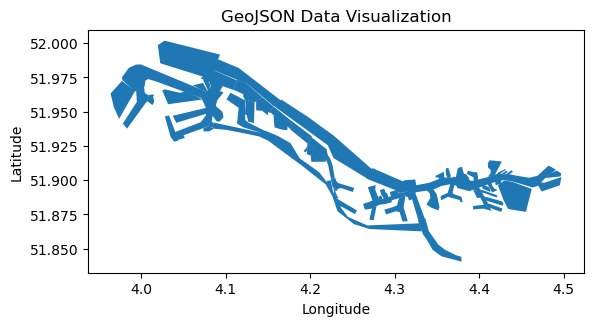

In [11]:
# Load the GeoJSON data from your file
file_path = 'Data/Input_EDA/haven.txt'
#file_path = 'Data/Input_EDA/haven.txt'
gdf_haven = gpd.read_file(file_path)
gdf_haven.dropna(axis=1)

# Plot the GeoDataFrame
gdf_haven.plot()
plt.title('GeoJSON Data Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

Visualization of the polygons representing the in-port water

In [12]:
# Create a map to visualize the areas
poly_map = folium.Map(
    location=[51.9, 4.2],    
    zoom_start=11,
    
)
gjson = folium.features.GeoJson(gdf_haven).add_to(poly_map)

poly_map


Merge of all the polygons

In [13]:
#Merge of the polygons
merged_haven = unary_union(gdf_haven['geometry'])

poly_map = folium.Map(
    location=[51.920280, 4.224052],    
    zoom_start=11.5
)
gjson = folium.features.GeoJson(merged_haven).add_to(poly_map)
folium.TileLayer('cartodbpositron').add_to(poly_map)

poly_map


As evident from the preceding map, the boundaries are somewhat ambiguous, with a substantial portion of land appearing as water (a closer look will reveal this). Consequently, we made the determination to seek more accurate data. A team member took the initiative to meticulously delineate all the coastlines within the Port of Rotterdam manually. This endeavor has enabled us to establish more accurate distinctions for the water boundaries.

In [14]:
# Import waterline from NL 
gdf_coast = gpd.read_file('Data/Input_EDA/NL_Waterline.gml', driver='GML')

In [15]:
# Define the custom coordinate system (modify this with your actual custom CRS)
NL_crs = "EPSG:28992"
# Define the target EPSG:4326 CRS
target_crs = "EPSG:4326"
# Create a GeoDataFrame and set the custom CRS
gdf_coast.set_crs(NL_crs, allow_override=True, inplace=True)
# Transform the geometries to EPSG:4326
gdf_coast = gdf_coast.to_crs(target_crs)


In [16]:
p1 = Point(51.91865, 3.92079)
p2 = Point(51.99519, 3.89333)
p3 = Point(52.0611, 4.01894)
p4 = Point(51.93935, 4.29704)
p5 = Point(51.94185, 4.53538)
p6 = Point(51.84609, 4.5546)
p7 = Point(51.81044, 4.28269)
p8 = Point(51.88806, 4.14468)
points = [p1, p2, p3, p4, p5, p6, p7, p8, p1]

big_area = Polygon([[p.y, p.x] for p in points])


In [17]:
haven_and_sea = unary_union((merged_haven,gdf_coast.head(1)['geometry'][0]))
polygon_gdf = gpd.GeoDataFrame(geometry=[haven_and_sea], crs=gdf_coast.crs)
intersection = gpd.clip(gdf_coast, polygon_gdf)
intersection = intersection[(intersection.geom_type == 'Polygon') | (intersection.geom_type == 'MultiPolygon')]
intersection = intersection[intersection.functie != 'waterzuivering']
intersection = intersection[(intersection.typeWater == 'waterloop') | (intersection.typeWater == 'zee')]
geometry_counts = intersection['typeWater'].value_counts()

intersection_union = unary_union(intersection['geometry'])

In [18]:
# The original polygon
original_polygon = gpd.GeoDataFrame(geometry=[big_area], crs=gdf_coast.crs)

# Define the diagonal length for each grid cell in meters (500 meters)

# Convert diagonal length from meters to degrees
def meters_to_degrees(meters):
    # Earth's radius in meters (approximately)
    earth_radius_meters = 6371000.0
    # Calculate the conversion factor from meters to degrees
    degrees_per_radian = 180.0 / np.pi
    radians_per_degree = np.pi / 180.0
    return (meters / earth_radius_meters) * degrees_per_radian

diagonal_length_degrees = meters_to_degrees(diagonal_length_meters)

# Calculate the size of each grid cell
cell_size = diagonal_length_degrees / np.sqrt(2)

# Get the bounding box of the original polygon
bbox = original_polygon.total_bounds  # Returns [minx, miny, maxx, maxy]

# Create a grid of points within the bounding box
x_min, y_min, x_max, y_max = bbox
x_coords = np.arange(x_min, x_max, cell_size)
y_coords = np.arange(y_min, y_max, cell_size)

# Create a list of square polygons as Shapely Polygons
square_polygons = [Polygon([(x, y), (x + cell_size, y), (x + cell_size, y + cell_size), (x, y + cell_size)]) for x in x_coords for y in y_coords]

# Create a GeoDataFrame from the square polygons
grid_gdf = gpd.GeoDataFrame(geometry=square_polygons, crs=original_polygon.crs)



In [19]:
# Filter the grid polygons to keep only those within the original polygon
grid_within_polygon = grid_gdf[grid_gdf.intersects(original_polygon.unary_union)]
grid_within_polygon.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2064 entries, 26 to 4130
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  2064 non-null   geometry
dtypes: geometry(1)
memory usage: 32.2 KB


In [20]:
# Get the sqares only from the the are of interest
grid_within_polygon = gpd.clip(grid_within_polygon, intersection)
grid_within_polygon.reset_index(inplace = True)
grid_within_polygon.rename(columns={"index": "area_ID"}, inplace = True)

In [55]:
# calcualte the centroid for each cell
grid_within_polygonbis = grid_within_polygon.copy()
grid_within_polygonbis['center'] = grid_within_polygonbis['geometry'].centroid
grid_within_polygonbis

/var/folders/h2/p_nmk5y57h30_tgf8ch2knm80000gn/T/ipykernel_40410/2192150957.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  grid_within_polygonbis['center'] = grid_within_polygonbis['geometry'].centroid


,area_ID,geometry,center
0,3044,"POLYGON ((4.37663 51.84224, 4.37914 51.84224, ...",POINT (4.37785 51.84172)
1,3004,"POLYGON ((4.37663 51.84224, 4.37663 51.84101, ...",POINT (4.37481 51.84177)
2,3045,"POLYGON ((4.37663 51.84224, 4.37663 51.84397, ...",POINT (4.37779 51.84309)
3,2965,"POLYGON ((4.37027 51.84256, 4.36966 51.84269, ...",POINT (4.36703 51.84475)
4,3005,"POLYGON ((4.37663 51.84224, 4.37199 51.84224, ...",POINT (4.37325 51.84349)
...,...,...,...
894,434,"POLYGON ((3.96328 52.02665, 3.95692 52.02665, ...",POINT (3.96012 52.02786)
895,634,"POLYGON ((3.99508 52.02665, 3.98872 52.02665, ...",POINT (3.99191 52.02810)
896,474,"POLYGON ((3.96964 52.02665, 3.96328 52.02665, ...",POINT (3.96648 52.02791)
897,594,"POLYGON ((3.98872 52.02665, 3.98236 52.02665, ...",POINT (3.98556 52.02805)


The final grid can be visualized below. This is the grid that is going to be used for the predictions method.

In [23]:
#grid_within_polygonbis.to_file('Data/Input_ML/areas_w_centr.geojson', driver= 'GeoJSON')

In [51]:
poly_map = folium.Map(
    location=[51.920280, 4.224052],    
    zoom_start=11.5
)
folium.TileLayer('cartodbpositron').add_to(poly_map)
folium.features.GeoJson(grid_within_polygon).add_to(poly_map) 

poly_map

# Trajectories

The "Trajectory approach" focuses on identifying the top 10 most frequently used havens. For each of these havens, trajectories representing vessel paths to and from the haven are derived. This process involves clustering all pick-up and drop-off locations associated with a specific harbor. The shortest path algorithm is then applied to generate the trajectory, effectively mapping the routes taken by vessels arriving at or departing from the haven.

The "Trajectory approach" involves several steps to identify the top 10 most frequently used havens and create trajectories representing vessel paths to and from these havens. Here's a breakdown of what the code does to implement this method:

1. Haven location calculation:
    - The code starts by extracting necessary haven locations from the 'to_location' of each haven and all tugboats' data.
2. Top 10 haven selection:
    - All tugboat movements (both incoming and leaving) are combined into a single dataset.
    - The top 10 most frequently used havens are determined.
3. Trajectory creation:
    - For each of the top 10 havens, the code clusters tugboat locations associated with that specific haven.
    - The KMeans algorithm is applied for clustering, with the number of clusters and distance threshold specified by the variables K and d, respectively.
    - Centroids of significant clusters are calculated and transformed to a projected coordinate system (EPSG 3857) for distance calculations.
    - The nearest points to the haven and sea are identified, and the shortest path algorithm (nearest_neighbor_tsp_gdf function) is used to create trajectories between these 2 points. These trajectories represent vessel paths to and from the haven.
    - Trajectories are stored in a GeoDataFrame named trajectories.
4. Trajectory visualization:
    - The generated trajectories are visualized on a map using the Folium library for geographical representation.
5. Distance calculation:
    - Trips' data (both incoming and leaving) are combined and processed.
    - Using geodesic distance calculation, the distance of each trip from the start (haven) and end (sea) points of the trajectory is computed and added to the dataset.

To sum up, we implemented the "Trajectory approach" by identifying top havens, clustering vessel pick-up and drop-off locations, creating trajectories, and calculating distances for vessel movements to and from these havens.

In [25]:

incoming_data = tugs_incoming_gdf.sort_values('from')
incoming_data.drop_duplicates(subset = 'trip_ID',keep='first', inplace = True)

leaving_data = tugs_leaving_gdf.sort_values('to')
leaving_data.drop_duplicates(subset = 'trip_ID',keep='last', inplace = True)

In [26]:
# calculate the top 10 haven by amount of towages 
all_tugs = pd.concat([tugs_incoming_gdf,tugs_leaving_gdf])
all_tugs['haven'] = all_tugs['to_haven'].combine_first(all_tugs['from_haven'])
top_10_haven = pd.DataFrame(all_tugs['haven'].value_counts()[:10]).reset_index()

In [27]:
# import datasets
incoming_trips = incoming_data.copy()
leaving_trips = leaving_data.copy()

def nearest_points_df(row, gdf, column):
    point = row[column]
    point_list = list(gdf[column])
    index = point_list.index(point)
    del point_list[index]
    points = MultiPoint(point_list)
    nearest = list(nearest_points(point, points))[1]
    return nearest

incoming_trips = incoming_trips.groupby('to_haven').apply(lambda x: x)
leaving_trips = leaving_trips.groupby('from_haven').apply(lambda x: x)

empty_incoming = []
empty_leaving = []

for haven in top_10_haven['haven']:
    gdf = incoming_trips.loc[haven]
    gdf['nearest'] = gdf.apply(lambda row: nearest_points_df(row, gdf,'from_location'), axis=1)
    empty_incoming.append(gdf)

for haven in top_10_haven['haven']:
    gdf = leaving_trips.loc[haven]
    gdf['nearest'] = gdf.apply(lambda row: nearest_points_df(row, gdf,'to_location'), axis=1)
    empty_leaving.append(gdf)


incoming_trips = pd.concat(empty_incoming)    
leaving_trips = pd.concat(empty_leaving)
    


/Users/allanguzmanf/opt/anaconda3/envs/CIEM6302/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/allanguzmanf/opt/anaconda3/envs/CIEM6302/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/allanguzmanf/opt/anaconda3/envs/CIEM6302/lib/python3.10/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A va

In [28]:
leaving_trips_f = leaving_trips.to_crs('EPSG:28992')
leaving_trips_f.set_geometry('nearest',inplace=True, crs = target_crs)
leaving_trips_f = leaving_trips_f.to_crs('EPSG:28992')
leaving_trips_f['distance'] = leaving_trips_f['geometry'].distance(leaving_trips_f['nearest'])
leaving_trips_f = leaving_trips_f[leaving_trips_f['distance'] < 1000]
leaving_trips_f.drop(columns= ['geometry', 'nearest', 'distance'], inplace=True)


In [29]:
incoming_trips_f = incoming_trips.to_crs('EPSG:28992')
incoming_trips_f.set_geometry('nearest',inplace=True, crs = target_crs)
incoming_trips_f = incoming_trips_f.to_crs('EPSG:28992')
incoming_trips_f['distance'] = incoming_trips_f['geometry'].distance(incoming_trips_f['nearest'])
incoming_trips_f = incoming_trips_f[incoming_trips_f['distance'] < 1000]
incoming_trips_f.drop(columns= ['geometry', 'nearest', 'distance'], inplace=True)


In [30]:
leaving_trips = leaving_trips_f.set_geometry('to_location',crs= target_crs)
leaving_trips = leaving_trips.reset_index(drop=True)

incoming_trips = incoming_trips_f.set_geometry('from_location',crs= target_crs)
incoming_trips = incoming_trips.reset_index(drop=True)


In [31]:
# Calculate distances from and to haven
all_trips = pd.concat([leaving_trips,incoming_trips])
all_trips.reset_index(drop=True, inplace=True)
all_trips['haven'] = all_trips['to_haven'].combine_first(all_trips['from_haven'])
all_trips['geometry'] = all_trips['to_location'].combine_first(all_trips['from_location'])
all_trips = all_trips[['trip_ID','geometry','haven','vessel_mmsi']]
all_trips = gpd.GeoDataFrame(all_trips,geometry='geometry')
all_trips.dropna(inplace=True)
# all_trips = all_trips[all_trips['haven'].isin(top_10_haven['haven'])]
all_trips.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 12566 entries, 0 to 12565
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   trip_ID      12566 non-null  int64   
 1   geometry     12566 non-null  geometry
 2   haven        12566 non-null  object  
 3   vessel_mmsi  12566 non-null  int64   
dtypes: geometry(1), int64(2), object(1)
memory usage: 392.8+ KB


In [32]:
#Compute the necessary haven locations from the 'to_location' of each haven and all tugs
haven_locations = tugs_df[tugs_df['type'] == 'incoming']
haven_locations = haven_locations[['to_location','to_haven']]
haven_locations = haven_locations.dropna(subset=['to_haven']).reset_index().drop(columns='index')
haven_locations[['long','lat']] = pd.DataFrame(haven_locations['to_location'].to_list(), columns=['latitude', 'longitude'])
haven_locations.drop(columns='to_location',inplace=True)
haven_locations = haven_locations.groupby("to_haven").mean() 


In [33]:
#  create a subset of towages for the top 10 havens to create the trajectories
haven_locations = haven_locations.loc[top_10_haven['haven']]
trajectories_input = all_trips[all_trips['haven'].isin(top_10_haven['haven'])]
trajectories_input = trajectories_input[['trip_ID',	'vessel_mmsi', 'geometry','haven']].groupby(by = 'haven').apply(lambda x: x)

In [34]:
#BIG FUNCTION!!!!
# Create a custom function to create LineString geometries from a list of Point geometries
def create_line_from_points(point_list):
    if len(point_list) < 2:
        return None
    return LineString(point_list)


def nearest_neighbor_tsp_gdf(gdf):
    start = gdf['geometry'].iloc[-1]
    unvisited = set(gdf.geometry)
    path = [start]
    unvisited.remove(start)

    while unvisited:
        nearest_point = min(unvisited, key=lambda point: point.distance(path[-1]))
        path.append(nearest_point)
        unvisited.remove(nearest_point)

    # After constructing a path, add the end point

    return path


def trajectory_line(gdf, haven, K, d, haven_locations):
    gdf_fx = gdf.copy()
    gdf_fx = gdf_fx.loc[haven]
    original_df = gdf_fx.copy()

    # Number of clusters (K) - You can determine this using the Elbow Method or Silhouette Score
    num_clusters = K  # Adjust as needed

    # Convert the Point geometries to a NumPy array for clustering
    points_array = [point.coords[0] for point in gdf_fx['geometry']]
    points_array = np.array(points_array)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++')
    gdf_fx['cluster'] = kmeans.fit_predict(points_array)

    cluster_counts = gdf_fx['cluster'].value_counts()
    cluster_counts = pd.DataFrame(cluster_counts)
    cluster_counts = cluster_counts[cluster_counts['count'] >= float(cluster_counts.sum()*0.015)].reset_index()

    gdf_fx = gdf_fx[gdf_fx['cluster'].isin(cluster_counts['cluster'])]


    centroids = kmeans.cluster_centers_ 
    centroids_gdf = [Point(x, y) for x, y in centroids]
    centroids_gdf = gpd.GeoDataFrame(geometry=centroids_gdf, crs=target_crs) 
    centroids_gdf = centroids_gdf.loc[cluster_counts['cluster']]
    # print(centroids_gdf)
    haven_point = Point(haven_locations.loc[haven]['long'],haven_locations.loc[haven]['lat'])

    haven_point_df = {'geometry': [haven_point]}
    haven_point_df = gpd.GeoDataFrame(haven_point_df, crs=target_crs) 

    # Transform the points to a projected coordinate system (e.g., EPSG 3857 for meters)
    centroids_gdf = gpd.GeoDataFrame(pd.concat([centroids_gdf, haven_point_df], ignore_index=True), crs=centroids_gdf.crs)
    # print(centroids_gdf)    
    centroids_gdf_n = centroids_gdf.to_crs(NL_crs)

    # Create a KD-Tree for efficient nearest neighbor search
    tree = KDTree(centroids_gdf_n.geometry.apply(lambda geom: (geom.x, geom.y)).tolist())

    # Set your threshold distance (in the same unit as the CRS)
    threshold_distance = d  # Replace with your desired threshold distance

    # Function to find the closest neighbor's distance
    def find_closest_distance(index, tree):
        distances, _ = tree.query([centroids_gdf_n.geometry.iloc[index].x, centroids_gdf_n.geometry.iloc[index].y], k=2)
        return distances[1]  # The closest neighbor is at index 0, so we take the second closest

    # Calculate the closest neighbor distances for each point
    centroids_gdf_n['closest_distance'] = [find_closest_distance(i, tree) for i in range(len(centroids_gdf_n))]

    # Filter the points based on the threshold distance
    filtered_gdf = centroids_gdf_n[centroids_gdf_n['closest_distance'] <= threshold_distance]

    # Remove the 'closest_distance' column if you don't need it anymore
    filtered_gdf = filtered_gdf.drop(columns=['closest_distance'])

    # Now, 'filtered_gdf' contains only the points whose closest neighbor is within the threshold distance.

    filtered_gdf.to_crs(target_crs, inplace= True)

    # Define start and end points as Shapely Point objects
    sea_point = Point(3.952107, 52.163755)
    
    # Calculate the distance from each point in the GeoDataFrame to the given points
    filtered_gdf['distance_to_haven'] = filtered_gdf.geometry.apply(lambda geom: geom.distance(haven_point))
    filtered_gdf['distance_to_sea'] = filtered_gdf.geometry.apply(lambda geom: geom.distance(sea_point))
    original_df['distance_to_haven'] = original_df.geometry.apply(lambda geom: geom.distance(sea_point))

    # Find the index of the point with the minimum distance to the given points
    nearest_haven_index = filtered_gdf['distance_to_haven'].idxmin()
    nearest_sea_index = filtered_gdf['distance_to_sea'].idxmin()
    nearest_sea_index_total = original_df['distance_to_haven'].idxmin()

    # Get the actual nearest points
    nearest_haven_point = filtered_gdf.at[nearest_haven_index, 'geometry']
    nearest_sea_point = filtered_gdf.at[nearest_sea_index, 'geometry']
    nearest_sea_point_total = original_df.loc[nearest_sea_index_total, 'geometry']

    # print(filtered_gdf)
    # Find the shortest path
    shortest_path = nearest_neighbor_tsp_gdf(filtered_gdf)
    #shortest_path.append(sea_point)
    #shortest_path.append(nearest_sea_point_total)
    # print(nearest_sea_point_total)

    path = gpd.GeoDataFrame(shortest_path, columns = ['geometry'] )
    # Create a new GeoDataFrame to store the lines
    lines_gdf = gpd.GeoDataFrame()

    # Apply the custom function to create lines
    lines_gdf['geometry'] = path.apply(create_line_from_points)
    lines_gdf['haven'] = haven

    # Plot the lines
    lines_gdf.set_crs(target_crs, inplace= True)

    return lines_gdf


In [64]:
# run the function for all the havens
trajectories = []
for haven in top_10_haven['haven']:
    trajectory = trajectory_line(trajectories_input, haven, 25, 15000, haven_locations)
    trajectories.append(trajectory)

trajectories = gpd.GeoDataFrame(pd.concat(trajectories, ignore_index=True), crs=trajectories[0].crs)

/Users/allanguzmanf/opt/anaconda3/envs/CIEM6302/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/h2/p_nmk5y57h30_tgf8ch2knm80000gn/T/ipykernel_40410/3484468028.py:43: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  cluster_counts = cluster_counts[cluster_counts['count'] >= float(cluster_counts.sum()*0.015)].reset_index()
/Users/allanguzmanf/opt/anaconda3/envs/CIEM6302/lib/python3.10/site-packages/geopandas/geoseries.py:645: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  result = super().apply(func, convert_dtype=convert_dtype, args=args, *

In [65]:
poly_map = folium.Map(
    location=[51.9, 4.2],    
    zoom_start=11
)

folium.features.GeoJson(trajectories).add_to(poly_map) 
poly_map

In [66]:
geod = Geod(ellps="WGS84")

#smoothing
trajectories_smooth = trajectories.copy()
trajectories.set_index('haven', inplace=True)
for index, row in trajectories_smooth.iterrows():
    original_geometry = row['geometry']
    smoothed_geometry = chaikin_smooth(original_geometry,iters=6,keep_ends= True)
    #smoothed_geometry = catmull_rom_smooth(original_geometry, alpha= 1, subdivs= 10)
    trajectories_smooth.at[index, 'geometry'] = smoothed_geometry

#trajectories_smooth.set_geometry('geometry', inplace=True)

trajectories_smooth.set_crs(target_crs, inplace=True)



trajectories_smooth['total_lengths'] = [geod.geometry_length(line) for line in trajectories_smooth['geometry']]
trajectories_smooth.set_index('haven', inplace=True)
trajectories_smooth.to_file('Data/Input_ML/trajectories.geojson', driver= 'GeoJSON')


colors = ["red", "green", "blue", "orange", "purple", "pink", "brown", "teal", "maroon", "violet"]
trajectories_smooth['color'] = colors

In [38]:
trajectories_input = trajectories_input.merge(trajectories_smooth['color'], left_index=True,right_index= True).drop(columns= ['haven'])

In [39]:
poly_map = folium.Map(
    location=[51.920280, 4.224052],    
    zoom_start=11.5
)

folium.TileLayer('cartodbpositron').add_to(poly_map)

for index, row in trajectories_input.iterrows():
    # Create a polyline for each row with the index in the tooltip
    folium.CircleMarker(
        location=(row['geometry'].y, row['geometry'].x),  # Swap lat and lon
        radius=3,  # Adjust the radius as needed for the size of the dot
        color=row['color'],  # Dot color
        fill= True,
        fill_color=row['color'],  # Dot fill color
        fill_opacity=0.6,
    ).add_to(poly_map)

# Save or display the map
poly_map

In [40]:
poly_map = folium.Map(
    location=[51.920280, 4.224052],    
    zoom_start=11.5
)

folium.TileLayer('cartodbpositron').add_to(poly_map)

for index, row in trajectories_smooth.iterrows():
    # Get the coordinates from the geometry column (assuming the geometry column is named 'geometry')
    coordinates = [list(coord) for coord in row['geometry'].coords]
    coordinates = [(x[1], x[0]) for x in coordinates]

    # Create a polyline for each row with the index in the tooltip
    tooltip = f'Polyline {index}'
    polyline = folium.PolyLine(locations=coordinates, color=trajectories_smooth['color'].loc[index], weight=5, tooltip=tooltip, crs='EPSG4326')
    # Add the polyline to the map
    polyline.add_to(poly_map)

# Save or display the map
poly_map

## Calculate distances from and to haven

In [41]:
def cut(line, point, total_length):
    distance = line.project(point, normalized=True)
    if distance <= 0.0 or distance >= 1.0:
        return total_length
    else:
        return total_length * distance

def distance(row):
    haven = row['haven']
    line = trajectories_smooth.loc[haven,'geometry']
    point = Point(row['geometry'])
    total_length = trajectories_smooth.loc[haven,'total_lengths']

    distance_out = cut(line=line, point=point, total_length=total_length)
    return distance_out

all_trips['distance'] = all_trips.apply(lambda row: pd.Series(distance(row)), axis=1)

# FINAL output dataset for prediction

In [59]:
# Assing the area to each point 
incoming_data_areas = gpd.sjoin(grid_within_polygonbis, incoming_trips, how="inner", predicate="contains")
incoming_data_areas = incoming_data_areas.merge(incoming_trips[['trip_ID','from_location']])

leaving_data_areas = gpd.sjoin(grid_within_polygonbis, leaving_trips, how="inner", predicate="contains")
leaving_data_areas = leaving_data_areas.merge(leaving_trips[['trip_ID','to_location']])


In [53]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

In [60]:
incoming_data_areas

,area_ID,geometry,center,index_right,from,from_rounded,to_haven,trip_ID,vessel_mmsi,from_location
0,2965,"POLYGON ((4.37027 51.84256, 4.36966 51.84269, ...",POINT (4.36703 51.84475),5755,2022-12-20 17:06:19+00:00,2022-12-20 17:00:00+00:00,3PET,13344,538003631,POINT (4.36715 51.84453)
1,3005,"POLYGON ((4.37663 51.84224, 4.37199 51.84224, ...",POINT (4.37325 51.84349),5933,2023-03-25 13:57:00+00:00,2023-03-25 14:00:00+00:00,3PET,20066,563081500,POINT (4.37324 51.84330)
2,2570,"POLYGON ((4.30668 51.88039, 4.30668 51.87761, ...",POINT (4.30353 51.87921),5548,2022-08-23 10:10:06+00:00,2022-08-23 10:00:00+00:00,3PET,5049,538009686,POINT (4.30400 51.87917)
3,2570,"POLYGON ((4.30668 51.88039, 4.30668 51.87761, ...",POINT (4.30353 51.87921),5901,2023-03-06 09:42:57+00:00,2023-03-06 10:00:00+00:00,3PET,18708,538008872,POINT (4.30324 51.87920)
4,2610,"POLYGON ((4.30896 51.87403, 4.30875 51.87448, ...",POINT (4.30941 51.87718),5529,2022-08-08 22:59:12+00:00,2022-08-08 23:00:00+00:00,3PET,4172,257037140,POINT (4.30772 51.87860)
...,...,...,...,...,...,...,...,...,...,...
6660,786,"POLYGON ((4.02051 51.97578, 4.01415 51.97578, ...",POINT (4.01710 51.97691),4526,2022-11-17 03:23:45+00:00,2022-11-17 03:00:00+00:00,YANG,11045,255806313,POINT (4.01833 51.97665)
6661,626,"POLYGON ((3.98872 51.98214, 3.99508 51.98214, ...",POINT (3.99190 51.97896),1550,2022-10-31 23:22:36+00:00,2022-10-31 23:00:00+00:00,7PET,9891,477150600,POINT (3.99059 51.97578)
6662,868,"POLYGON ((4.02687 51.99486, 4.03323 51.99486, ...",POINT (4.03005 51.99168),2600,2023-01-26 12:03:12+00:00,2023-01-26 12:00:00+00:00,AMALIA,16014,211112000,POINT (4.03298 51.99255)
6663,549,"POLYGON ((3.97600 52.00121, 3.98236 52.00121, ...",POINT (3.97918 51.99804),646,2022-12-24 10:04:59+00:00,2022-12-24 10:00:00+00:00,EURO,13600,244860278,POINT (3.97722 51.99880)


In [61]:
incoming_data = gpd.GeoDataFrame(incoming_data_areas, geometry='from_location')
incoming_data["area"] = incoming_data.apply(lambda x: x["geometry"].wkt, axis=1)
incoming_data = incoming_data.drop(columns='geometry')
incoming_data["center"] = incoming_data.apply(lambda x: x["center"].wkt, axis=1)

incoming_data = incoming_data.merge(all_trips[['trip_ID','distance']]).drop(columns = 'trip_ID')

incoming_data = incoming_data.merge(wind[['Datetime', 'Wind_Direction_Cat1','Wind_Direction_Cat2', 'Wind_Speed']], left_on = 'from_rounded', right_on = 'Datetime', how = 'left')
incoming_data.drop(columns = ['Datetime','index_right'], inplace= True)

incoming_data['Wind_Direction'] = label_encoder.fit_transform(incoming_data['Wind_Direction_Cat1'])

print(incoming_data.info())
# incoming_data.to_file('Data/Input_ML/incoming_weather.geojson', driver= 'GeoJSON')

incoming_data = incoming_data.merge(vessel_size_data, left_on = 'vessel_mmsi', right_on = 'device_mmsi', how = 'inner')
incoming_data.drop(columns = ['device_mmsi'], inplace= True)

incoming_data['Type_Cat'] = label_encoder.fit_transform(incoming_data['Type'])
print(incoming_data.info())
# incoming_data.to_file('Data/Input_ML/incoming_weather_size.geojson', driver= 'GeoJSON')

incoming_data = incoming_data.merge(vessel_draught_data, left_on = ['vessel_mmsi','from_rounded'], right_on = ['device_mmsi','DateTime'], how = 'inner')
incoming_data.drop(columns = ['device_mmsi', 'DateTime'], inplace= True)
print(incoming_data.info())
# incoming_data.to_file('Data/Input_ML/incoming_weather_size_draught.geojson', driver= 'GeoJSON')

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6665 entries, 0 to 6664
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   area_ID              6665 non-null   int64              
 1   center               6665 non-null   object             
 2   from                 6665 non-null   datetime64[ns, UTC]
 3   from_rounded         6665 non-null   datetime64[ns, UTC]
 4   to_haven             6665 non-null   object             
 5   vessel_mmsi          6665 non-null   int64              
 6   from_location        6665 non-null   geometry           
 7   area                 6665 non-null   object             
 8   distance             6665 non-null   float64            
 9   Wind_Direction_Cat1  6665 non-null   object             
 10  Wind_Direction_Cat2  6665 non-null   object             
 11  Wind_Speed           6665 non-null   int64              
 12  Wind_Directi

In [62]:
leaving_data = gpd.GeoDataFrame(leaving_data_areas, geometry='to_location')
leaving_data["area"] = leaving_data.apply(lambda x: x["geometry"].wkt, axis=1)
leaving_data = leaving_data.drop(columns='geometry')
leaving_data["center"] = leaving_data.apply(lambda x: x["center"].wkt, axis=1)

leaving_data = leaving_data.merge(all_trips[['trip_ID','distance']]).drop(columns = 'trip_ID')

leaving_data = leaving_data.merge(wind[['Datetime', 'Wind_Direction_Cat1','Wind_Direction_Cat2', 'Wind_Speed']], left_on = 'to_rounded', right_on = 'Datetime', how = 'left')
leaving_data.drop(columns = ['Datetime','index_right'], inplace= True)

leaving_data['Wind_Direction'] = label_encoder.fit_transform(leaving_data['Wind_Direction_Cat1'])

print(leaving_data.info())
# leaving_data.to_file('Data/Input_ML/leaving_weather.geojson', driver= 'GeoJSON')

leaving_data = leaving_data.merge(vessel_size_data, left_on = 'vessel_mmsi', right_on = 'device_mmsi', how = 'inner')
leaving_data.drop(columns = ['device_mmsi'], inplace= True)

leaving_data['Type_Cat'] = label_encoder.fit_transform(leaving_data['Type'])
print(leaving_data.info())
# leaving_data.to_file('Data/Input_ML/leaving_weather_size.geojson', driver= 'GeoJSON')

leaving_data = leaving_data.merge(vessel_draught_data, left_on = ['vessel_mmsi','to_rounded'], right_on = ['device_mmsi','DateTime'], how = 'inner')
leaving_data.drop(columns = ['device_mmsi', 'DateTime'], inplace= True)
print(leaving_data.info())
# leaving_data.to_file('Data/Input_ML/leaving_weather_size_draught.geojson', driver= 'GeoJSON')

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5896 entries, 0 to 5895
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   area_ID              5896 non-null   int64              
 1   center               5896 non-null   object             
 2   to                   5896 non-null   datetime64[ns, UTC]
 3   to_rounded           5896 non-null   datetime64[ns, UTC]
 4   from_haven           5896 non-null   object             
 5   vessel_mmsi          5896 non-null   int64              
 6   to_location          5896 non-null   geometry           
 7   area                 5896 non-null   object             
 8   distance             5896 non-null   float64            
 9   Wind_Direction_Cat1  5896 non-null   object             
 10  Wind_Direction_Cat2  5896 non-null   object             
 11  Wind_Speed           5896 non-null   int64              
 12  Wind_Directi

In summary, our selection of variables for this study includes length, width, draught, wind speed, wind direction, harbour (to or from, whether the vessel is leaving or incoming), vessel type, and the status of being "leaving or incoming." These variables were chosen based on both data-driven analysis and our intuition. However, we can't exactlyknow if each variables really plays a role or not. Thus, we believe these factors are crucial within the dataset for the following reasons:

1. Boat dimensions (length, width): The size of the boat could impact the requirement for tugs. Larger vessels might require more assistance, and their dimensions can affect the duration and complexity of the process.

2. Draught: The draught of the boat, indicating how much of it is submerged in water, can influence navigation. Different draught levels might require different tug assistance, especially in terms of turning and maneuvering.

3. Wind conditions (speed, direction): Rotterdam's windy environment is a vital consideration. The flat terrain offers no natural windbreaks, potentially making wind a significant factor. Wind speed and direction can greatly affect a boat's ability to navigate, making it an essential variable for the need of tugboat.

4. Harbour (leaving or incoming): Whether the vessel is leaving or incoming determines its starting and ending points. This information is fundamental for understanding where tugs are needed, considering departure and arrival locations.

5. Vessel type: Different types of boats have varying capabilities. Some boats might be more adept at navigating challenging conditions, requiring less tug assistance, while others might need more support. Understanding the vessel type provides crucial insights into its self-navigating abilities.

6. Distance

These variables were chosen using a combination of data analysis and our intuition, which comes from familiarity with maritime operations, via articles, movies, etc. By taking these things into account, we aim to gain a comprehensive understanding of the vessels pick-ups and drop-offs in Rotterdam, ensuring effective and safe navigation in this windy and challenging maritime environment.

# testing (not to grade)

In [37]:
# Define the order of the B-spline (typically cubic, i.e., order=3).
order = 5

# Create a parameter vector.
t = np.linspace(0, 1, len(centroids) - order + 2, endpoint=True)

# Create the B-spline curve.
spline = BSpline(t, centroids, order)

# Generate a finer set of points on the B-spline curve for plotting.
finer_points = np.linspace(0, 1, 100)
spline_points = spline(finer_points)

# Plot the B-spline curve and control points.
plt.plot(spline_points[:, 0], spline_points[:, 1], label="B-spline")
plt.scatter(centroids[:, 0], centroids[:, 1,], c="red", label="Control Points")
plt.legend()
plt.title("B-spline Interpolation")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid()
plt.show()

NameError: name 'centroids' is not defined

In [ ]:

# Create a LineString for each cluster
trajectories = []
for cluster_id in range(num_clusters):
    cluster_points = trajectories_input[trajectories_input['cluster'] == cluster_id]['geometry'].values
    cluster_coords = [point.coords[0] for point in cluster_points]

    # Apply PCA to the cluster points
    pca = PCA(n_components=2)
    pca.fit(cluster_coords)
    pca_points = pca.transform(cluster_coords)

    # Create a LineString from the PCA-transformed points
    trajectory = LineString(pca_points.tolist())
    trajectories.append(trajectory)

# Create a new GeoDataFrame with the resulting LineStrings
line_gdf = gpd.GeoDataFrame({'geometry': trajectories})


In [ ]:

# Assuming you have a GeoDataFrame 'gdf' with a 'geometry' column containing Point objects
points = np.array([(point.y, point.x) for point in trajectories_input['geometry']])
tree = KDTree(points) 

def mls_smooth(point, radius):
    indices = tree.query_ball_point(point, r=radius)
    local_points = points[indices]
    return np.mean(local_points, axis=0)

# Define a radius for MLS smoothing
radius = 1 # Adjust this based on your data

smoothed_points = [mls_smooth(point, radius) for point in points]

# Convert the smoothed points back to Shapely Points
smoothed_geometry = [Point(coord[0], coord[1]) for coord in smoothed_points]

line = LineString(smoothed_geometry)



In [ ]:
line_gdf.plot()

We now possess two primary data frames, namely "leaving_data" and "incoming_data," which will serve as the foundation for our prediction model(s). These data frames have been meticulously processed and optimized, ensuring their readiness for the most efficient utilization in our analyses.


Finally, you can find below the visualization of a haven and all towages of the incoming tugs (tugs going to this haven). If wanted, it is also possible to do the same for each haven by changing the variable "selected_haven". Furthermore, by remplacing the variable "tugs_incoming_gdf" by "tugs_leaving_gdf", you can the observed the situation for the leaving tugs of a special haven.

In [ ]:
selected_haven = '6PET'


# Create a Folium Map
poly_map = folium.Map(
    location=[51.9, 4.2],
    zoom_start=11
)

# Filter the GeoDataFrame for markers with 'to_haven' equal to '7PET'
heaven_gdf = tugs_incoming_gdf[tugs_incoming_gdf['to_haven'] == selected_haven]


filtered_grid = gpd.sjoin(grid_within_polygon, heaven_gdf, how="inner", op="intersects")

#filtered_grid.drop_duplicates(subset='geometry', keep='first', inplace=True, ignore_index=False)

folium.features.GeoJson(filtered_grid['geometry']).add_to(poly_map) 

# Add CircleMarker for each point in the heaven GeoDataFrame
for index, row in heaven_gdf.iterrows():
    folium.CircleMarker(
        location=(row['geometry'].y, row['geometry'].x),  # Swap lat and lon
        radius=3,  # Adjust the radius as needed for the size of the dot
        color='red',  # Dot color
        fill=True,
        fill_color='red',  # Dot fill color
        fill_opacity=0.6,
    ).add_to(poly_map)
    
line.add_to(poly_map) 


# Display the map
poly_map


**Visualizations on the final dataset**

In [ ]:
custom_colors = ['mediumslateblue', 'goldenrod', 'darkgrey']

Representation in % of the different types of vessels in the leaving dataset. 

In [ ]:
# Count the number of unique vessel types
vessel_type_counts = leaving_data['Type'].value_counts()

plt.figure(figsize=(7, 4))
plt.pie(vessel_type_counts, autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Vessel type distribution (%)')

# Add a legend
plt.legend(vessel_type_counts.index, title='Vessel types', loc='best')
plt.axis('equal')  
plt.show()

Representation in % of the different types of vessels in the incoming dataset. 

In [ ]:
# Count the number of unique vessel types
vessel_type_counts = incoming_data['Type'].value_counts()

plt.figure(figsize=(7, 4))
plt.pie(vessel_type_counts, autopct='%1.1f%%', startangle=140, colors=custom_colors)
plt.title('Vessel type distribution (%)')

# Add a legend
plt.legend(vessel_type_counts.index, title='Vessel types', loc='best')
plt.axis('equal')  
plt.show()

Visualizations of the dimensions and their quantiles in the leaving dataset.

In [ ]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 20))

# List of dimensions
dimensions = ['Lenght', 'Width', 'Navigation_draught']

# Iterate over dimensions and corresponding subplots
for dimension, ax in zip(dimensions, axes.flatten()):
    sns.boxplot(data=leaving_data, x='Type', y=dimension, palette=custom_colors, ax=ax)
    ax.set_xlabel('Vessel type')
    ax.set_ylabel(f'Device dimensions to {dimension.split("_")[-1].title()}')
    
    # Calculate and display statistical properties
    for vessel_type in leaving_data['Type'].unique():
        subset_data = leaving_data[leaving_data['Type'] == vessel_type]
        median = subset_data[dimension].median()
        q1 = subset_data[dimension].quantile(0.25)
        q3 = subset_data[dimension].quantile(0.75)
        max_val = subset_data[dimension].max()
    

# Set a single title for all subplots
fig.suptitle('Dimensions', fontsize=16)
plt.tight_layout()
plt.show()

Visualizations of the dimensions and their quantiles in the incoming dataset.

In [ ]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 20))

# List of dimensions
dimensions = ['Lenght', 'Width', 'Navigation_draught']

# Iterate over dimensions and corresponding subplots
for dimension, ax in zip(dimensions, axes.flatten()):
    sns.boxplot(data=incoming_data, x='Type', y=dimension, palette=custom_colors, ax=ax)
    ax.set_xlabel('Vessel type')
    ax.set_ylabel(f'Device dimensions to {dimension.split("_")[-1].title()}')
    
    # Calculate and display statistical properties
    for vessel_type in incoming_data['Type'].unique():
        subset_data = incoming_data[incoming_data['Type'] == vessel_type]
        median = subset_data[dimension].median()
        q1 = subset_data[dimension].quantile(0.25)
        q3 = subset_data[dimension].quantile(0.75)
        max_val = subset_data[dimension].max()
    

# Set a single title for all subplots
fig.suptitle('Dimensions', fontsize=16)
plt.tight_layout()
plt.show()

Below is the code that we used before using the special tool. The code was running and working. However, we also made some changes and took some design decisions about the variables in this tool only. Indeed, the running time when it came to load more than one month became way too high. So we decided to use Alteryx Designer.

In [ ]:
# def flatten_dict(d, parent_key='', sep='_'):
#     items = {}
#     for k, v in d.items():
#         new_key = f"{parent_key}{sep}{k}" if parent_key else k
#         if isinstance(v, dict):
#             items.update(flatten_dict(v, new_key, sep=sep))
#         else:
#             items[new_key] = v
#     return items


# data = pd.DataFrame()
# for i in range(6,13):
#     # Opening JSON file
#     f = open('Rotterdam_data/ais_rotterdam/ais_rotterdam_'+str(i)+'.json')
    
#     # returns JSON object as a dictionary
#     json_data = json.load(f)
    
#     # Flatten each dictionary and store the results in a list
#     flattened_dicts = [flatten_dict(d) for d in json_data['data']]
    
#     # Create a DataFrame
#     data = pd.concat([data, pd.DataFrame(flattened_dicts)])

# # Closing file
# f.close()

In [ ]:
# #data['navigation_destination_eta'] = pd.to_datetime(data['navigation_destination_eta'])
# #data['navigation_time'] = pd.to_datetime(data['navigation_time'])
# # Remove rows where 'vessel_type' is 'tug'
# data = data[data['vessel_type'] != 'tug']
# # Remove the 'vessel_subtype' column
# data = data.drop('vessel_subtype', 'vessel_callsign','navigation_status', 'navigation_destination_eta', 'navigation_heading', 'navigation_time', 'navigation_course', 'navigation_speed	', 'navigation_location_type', 'navigation_location_coordinates')
# #data[['navigation_location_lat', 'navigation_location_long']] = data['navigation_location_coordinates'].apply(lambda x: pd.Series(str(x).strip('[]').split(','))).astype(float)
# data

In [ ]:
# columns_to_drop = [
#     'vessel_callsign',
#     'navigation_heading',
#     'navigation_course',
#     'navigation_speed',
#     'navigation_location_type',
# ]

# numeric_columns = [
#     'device_mmsi',
#     'device_dimensions_to_bow',           
#     'device_dimensions_to_stern',       
#     'device_dimensions_to_starboard',     
#     'device_dimensions_to_port',
#     #'vessel_imo'
#     'navigation_draught',
#     #'vessel_type',
#     #'vessel_subtype'
# ]

# info_columns = [
#     'device_mmsi',
#     'vessel_type',
#     #'vessel_subtype'
# ]

# vessel_size = data[numeric_columns]
# vessel_size = vessel_size.groupby('device_mmsi').median()
# vessel_size['length'] = vessel_size['device_dimensions_to_bow'] + vessel_size['device_dimensions_to_stern']
# vessel_size['width'] = vessel_size['device_dimensions_to_starboard'] + vessel_size['device_dimensions_to_port']
# vessel_size.drop(['device_dimensions_to_bow','device_dimensions_to_stern', 'device_dimensions_to_starboard' ,'device_dimensions_to_port'], axis=1, inplace=True)
# vessel_size.reset_index(inplace=True)

# vessel_info = data[info_columns]  

# vessel_info = vessel_info.groupby('device_mmsi').agg(lambda x: x.mode(0))
# vessel_info.reset_index(inplace=True)

# vessel_data = pd.merge(vessel_size,vessel_info)
# vessel_data['vessel_type_Code'], unique_values = pd.factorize(vessel_data['vessel_type'])
# main_db = pd.merge(tugs_dfb,vessel_data,how= 'right',left_on='vessel_mmsi',right_on='device_mmsi')
# main_db.dropna(inplace=True)

In [ ]:
# Number of clusters (K) - You can determine this using the Elbow Method or Silhouette Score
num_clusters = 20  # Adjust as needed

# Convert the Point geometries to a NumPy array for clustering
points_array = [point.coords[0] for point in trajectories_input['geometry']]
points_array = np.array(points_array)

# Apply K-Means clustering
kmeans = KMeans(n_clusters=num_clusters, init='k-means++')
trajectories_input['cluster'] = kmeans.fit_predict(points_array)

In [ ]:
cluster_counts = trajectories_input['cluster'].value_counts()
cluster_counts = pd.DataFrame(cluster_counts)
cluster_counts = cluster_counts[cluster_counts['count'] >= float(cluster_counts.sum()*0.01)].reset_index()

trajectories_input = trajectories_input[trajectories_input['cluster'].isin(cluster_counts['cluster'])]

In [ ]:
centroids = kmeans.cluster_centers_ 
centroids_gdf = [Point(x, y) for x, y in centroids]
centroids_gdf = gpd.GeoDataFrame(geometry=centroids_gdf, crs=target_crs).reset_index()
centroids_gdf = centroids_gdf[centroids_gdf['index'].isin(cluster_counts['cluster'])]

# Transform the points to a projected coordinate system (e.g., EPSG 3857 for meters)
centroids_gdf_n = centroids_gdf.to_crs(epsg=3857)

# Create a KD-Tree for efficient nearest neighbor search
tree = KDTree(centroids_gdf_n.geometry.apply(lambda geom: (geom.x, geom.y)).tolist())

# Set your threshold distance (in the same unit as the CRS)
threshold_distance = 5000  # Replace with your desired threshold distance

# Function to find the closest neighbor's distance
def find_closest_distance(index, tree):
    distances, _ = tree.query([centroids_gdf_n.geometry.iloc[index].x, centroids_gdf_n.geometry.iloc[index].y], k=2)
    return distances[1]  # The closest neighbor is at index 0, so we take the second closest

# Calculate the closest neighbor distances for each point
centroids_gdf_n['closest_distance'] = [find_closest_distance(i, tree) for i in range(len(centroids_gdf_n))]

# Filter the points based on the threshold distance
filtered_gdf = centroids_gdf_n[centroids_gdf_n['closest_distance'] <= threshold_distance]

# Remove the 'closest_distance' column if you don't need it anymore
filtered_gdf = filtered_gdf.drop(columns=['closest_distance'])

# Now, 'filtered_gdf' contains only the points whose closest neighbor is within the threshold distance.

filtered_gdf.to_crs(target_crs, inplace= True)


In [ ]:
poly_map = folium.Map(
    location=[51.9, 4.2],    
    zoom_start=11
)

folium.features.GeoJson(filtered_gdf).add_to(poly_map) 

poly_map

In [ ]:
def nearest_neighbor_tsp_gdf(gdf, start, end):
    unvisited = set(gdf.geometry)
    path = [start]
    unvisited.remove(start)

    while unvisited:
        nearest_point = min(unvisited, key=lambda point: point.distance(path[-1]))
        path.append(nearest_point)
        unvisited.remove(nearest_point)

    # After constructing a path, add the end point
    path.append(end)

    return path


In [ ]:
# Define start and end points as Shapely Point objects
haven_point = Point(haven_locations.loc[selected_haven]['long'],haven_locations.loc[selected_haven]['lat'])
sea_point = Point(4.069379, 52.032103)


# Calculate the distance from each point in the GeoDataFrame to the given points
filtered_gdf['distance_to_haven'] = filtered_gdf.geometry.apply(lambda geom: geom.distance(haven_point))
filtered_gdf['distance_to_sea'] = filtered_gdf.geometry.apply(lambda geom: geom.distance(sea_point))

# Find the index of the point with the minimum distance to the given points
nearest_haven_index = filtered_gdf['distance_to_haven'].idxmin()
nearest_sea_index = filtered_gdf['distance_to_sea'].idxmin()

# Get the actual nearest points
nearest_haven_point = filtered_gdf.at[nearest_haven_index, 'geometry']
nearest_sea_point = filtered_gdf.at[nearest_sea_index, 'geometry']

print(nearest_haven_point)
print(nearest_sea_point)

# Find the shortest path
shortest_path = nearest_neighbor_tsp_gdf(filtered_gdf,nearest_haven_point, nearest_sea_point)
#print(shortest_path)

path = gpd.GeoDataFrame(shortest_path, columns = ['geometry'] )